---
title: Interactive Timelines (ipynb)
description: Usign Altair to create interactive plots of teh earthquake data over time
authors:
  - userId: fI5cWFyZPEZCTpIHdqX5H8OU3Iv1
    name: Steve Purves
    orcid: 0000-0002-0760-5497
    corresponding: false
    roles: []
    affiliations: []
date: '2022-09-06T12:42:01.452Z'
name: interactive-timelines-altair
oxa: oxa:1Bk7uPlcMuaTyKEshESj/mIl6SWxXvUdfdY1UNExv
tags: []
thumbnail: thumbnails/interactive-timelines-altair.png
---

## Visualization of La Palma Earthquake Data

Using the subset of IGN data specific to La Palma. This subset was prepared using `screening.ipynb` and saved to `lapalma.csv`.

In [1]:
import pandas as pd
import altair as alt
alt.data_transformers.enable('default', max_rows=None)
import numpy as np

In [2]:
df = pd.read_csv('./lapalma.csv')

In [3]:
df['Datetime'] = (df['Date'] + ' ' + df['UTC time']).apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S')
df.head()

,Event,Date,UTC time,Local time(*),Latitude,Longitude,Depth(km),Magnitude,Mag. type,Max. int,Region,More Info,Datetime
0,es2022chvdg,2022-02-02,17:31:41,17:31:41,28.6224,-17.9208,0.0,1.7,mbLg,NaN,SE TAZACORTE.ILP,NaN,2022-02-02 17:31:41
1,es2022chfbg,2022-02-02,09:24:25,09:24:25,28.5381,-17.8586,34.0,2.2,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,2022-02-02 09:24:25
2,es2022cffbs,2022-02-01,07:10:21,07:10:21,28.5515,-17.8468,11.0,1.6,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,2022-02-01 07:10:21
3,es2022cfagc,2022-02-01,04:42:34,04:42:34,28.5655,-17.8853,9.0,2.2,mbLg,NaN,NW FUENCALIENTE DE LA PALMA.IL,NaN,2022-02-01 04:42:34
4,es2022cewue,2022-02-01,02:57:48,02:57:48,28.5866,-17.9535,8.0,1.8,mbLg,NaN,SW TAZACORTE.ILP,NaN,2022-02-01 02:57:48


In [4]:
df.describe()

,Latitude,Longitude,Depth(km),Magnitude,More Info
count,9098.000000,9098.000000,9098.000000,9098.000000,0.0
mean,28.566890,-17.839844,14.031875,2.682919,NaN
std,0.016284,0.021431,8.336468,0.512196,NaN
min,28.477500,-17.969500,0.000000,1.500000,NaN
25%,28.558400,-17.846600,10.300000,2.400000,NaN
50%,28.563600,-17.836900,11.300000,2.700000,NaN
75%,28.571000,-17.829100,13.500000,3.000000,NaN
max,28.697000,-17.705700,46.900000,5.100000,NaN


In [5]:
df['Depth'] = 'Crustal (<20km)'
df.loc[df['Depth(km)'] >= 20, 'Depth'] = 'Mantle (>20km)'

In [6]:
brush = alt.selection_interval(encodings=['x'])

bars = alt.Chart(df, width=700, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Earthquake event magnitude since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter = alt.Chart(df, width=700, height=350).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Datetime:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'), scale=alt.Scale(scheme='category10')),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


detail_scatter & bars

alt.VConcatChart(...)

In [7]:
brush = alt.selection_interval(encodings=['x'])

bars = alt.Chart(df, width=700, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter = alt.Chart(df, width=700, height=500).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Magnitude:Q', title='magnitude', axis=alt.Axis(labelAngle=-45), scale=alt.Scale(domain=[1.5, 6])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray')),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


detail_scatter & bars

alt.VConcatChart(...)

In [8]:
brush = alt.selection_interval(encodings=['x'])

total_width = 1200
scatter_height = 500

bars = alt.Chart(df, width=total_width, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter_long = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Longitude:Q', title='Longitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[-18, -17.7])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)

detail_scatter_lat = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Latitude:Q', title='Latitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[28.4, 28.7])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.Color('Magnitude:Q'),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,5], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


( detail_scatter_long | detail_scatter_lat ) & bars

alt.VConcatChart(...)

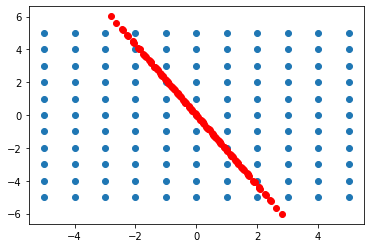

In [9]:
import math
import matplotlib.pyplot as plt

angle_to_north = -25*(math.pi/180)
s = np.array([math.sin(angle_to_north), math.cos(angle_to_north)])

def project(sn, x):
    return sn * (np.dot(x, sn) / np.dot(sn, sn))
    

lat = np.linspace(-5, 5, 11)
lng = np.linspace(-5, 5, 11)
# full coorindate arrays
llng, llat = np.meshgrid(lng, lat, indexing='xy')

plt.scatter(llng, llat)
    
points = np.stack((llng.flatten(),llat.flatten()), axis=1)
ppts = [project(s,points[n,:]) for n in range(0,points.shape[0]) ]

llng, llat = np.stack(ppts, axis=1)

plt.scatter(llng, llat, color='r')

In [10]:
# remote geojson data object
url_geojson = 'https://raw.githubusercontent.com/mattijn/datasets/master/two_polygons.geo.json'
data_geojson_remote = alt.Data(url=url_geojson, format=alt.DataFormat(property='features',type='json'))

# chart object
alt.Chart(data_geojson_remote).mark_geoshape(
).encode(
    color="properties.name:N"
).project(
    type='identity', reflectY=True
)

alt.Chart(...)